https://www.analyticsvidhya.com/blog/2019/07/how-to-build-recommendation-system-word2vec-python/

## Import Libraries and Load Data

In [1]:
import pandas as pd
import numpy as np
import random
from tqdm import tqdm
from gensim.models import Word2Vec 
import matplotlib.pyplot as plt
%matplotlib inline

import warnings;
warnings.filterwarnings('ignore')

In [2]:
#df = pd.read_excel('data/Online Retail.xlsx')

In [3]:
from Database import db_mongo

from Utilities import clean_text

import string

db = db_mongo.db_mongo()

df = db.get_text_full_resume(100000000)

df = df.sample(frac=1).reset_index(drop=True)

Init DB


In [4]:
ct = clean_text.CleanText()

df['text'] = ct.cleanner_process(df["text"])

[nltk_data] Downloading package wordnet to /home/kguttas/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [5]:
df.head()

,_id,text,class
0,6df5f405-9804-4751-9639-1ca500224ec8,public relat intern summari public relat digit...,DIGITAL-MEDIA
1,2ae79bdd-e156-4642-ba08-029b73278705,director facil construct execut profil mechan ...,CONSTRUCTION
2,526ba5c4-ff01-474b-99ff-e1bbd2bbe724,senior busi develop manag summari busi develop...,BUSINESS-DEVELOPMENT
3,31eae8e3-9162-4e7f-b435-fdda4ed9854f,work system engin qualif microsoft officeoffic...,INFORMATION-TECHNOLOGY
4,0194db7b-20ef-42dd-abc7-4d1c221e171a,document control contract posit summari dedic ...,APPAREL


In [6]:
df["StockCode"] = df["_id"]
df["Description"] = df["text"]
df["CustomerID"] = df["class"]

Let's take a quick look at our data. You can __download it from [here](https://archive.ics.uci.edu/ml/machine-learning-databases/00352/).__

In [7]:
df.head()

,_id,text,class,StockCode,Description,CustomerID
0,6df5f405-9804-4751-9639-1ca500224ec8,public relat intern summari public relat digit...,DIGITAL-MEDIA,public relat intern summari public relat digit...,public relat intern summari public relat digit...,DIGITAL-MEDIA
1,2ae79bdd-e156-4642-ba08-029b73278705,director facil construct execut profil mechan ...,CONSTRUCTION,director facil construct execut profil mechan ...,director facil construct execut profil mechan ...,CONSTRUCTION
2,526ba5c4-ff01-474b-99ff-e1bbd2bbe724,senior busi develop manag summari busi develop...,BUSINESS-DEVELOPMENT,senior busi develop manag summari busi develop...,senior busi develop manag summari busi develop...,BUSINESS-DEVELOPMENT
3,31eae8e3-9162-4e7f-b435-fdda4ed9854f,work system engin qualif microsoft officeoffic...,INFORMATION-TECHNOLOGY,work system engin qualif microsoft officeoffic...,work system engin qualif microsoft officeoffic...,INFORMATION-TECHNOLOGY
4,0194db7b-20ef-42dd-abc7-4d1c221e171a,document control contract posit summari dedic ...,APPAREL,document control contract posit summari dedic ...,document control contract posit summari dedic ...,APPAREL


Given below is the description of the fields in this dataset:

1. __InvoiceNo:__ Invoice number, a unique number assigned to each transaction.

2. __StockCode:__ Product/item code. a unique number assigned to each distinct product.

3. __Description:__ Product description

4. __Quantity:__ The quantities of each product per transaction.

5. __InvoiceDate:__ Invoice Date and time. The day and time when each transaction was generated.

6. __CustomerID:__ Customer number, a unique number assigned to each customer.

In [8]:
df.shape

(2484, 6)

The dataset contains 541,909 transactions. That is a pretty good number for us.

## Treat Missing Data

In [9]:
# check for missing values
df.isnull().sum()

_id            0
text           0
class          0
StockCode      0
Description    0
CustomerID     0
dtype: int64

<br>
Since we have sufficient data, we will drop all the rows with missing values.

In [10]:
# remove missing values
df.dropna(inplace=True)

# again check missing values
df.isnull().sum()

_id            0
text           0
class          0
StockCode      0
Description    0
CustomerID     0
dtype: int64

## Data Preparation

Let's convert the StockCode to string datatype.

In [11]:
df['StockCode']= df['StockCode'].astype(str)

Let's check out the number of unique customers in our dataset.

In [12]:
customers = df["CustomerID"].unique().tolist()
len(customers)

24

There are 4,372 customers in our dataset. For each of these customers we will extract their buying history. In other words, we can have 4,372 sequences of purchases.

It is a good practice to set aside a small part of the dataset for validation purpose. Therefore, I will use data of 90% of the customers to create word2vec embeddings. Let's split the data.

In [13]:
# shuffle customer ID's
#random.shuffle(customers)

# extract 90% of customer ID's
customers_train = [customers[i] for i in range(round(0.8*len(customers)))]

# split data into train and validation set
train_df = df[df['CustomerID'].isin(customers_train)]
validation_df = df[~df['CustomerID'].isin(customers_train)]

In [14]:
customers_train[0]

'DIGITAL-MEDIA'

Let's create sequences of purchases made by the customers in the dataset for both the train and validation set.

In [15]:
# list to capture purchase history of the customers
purchases_train = []

# populate the list with the product codes
for i in tqdm(customers_train):
    temp = train_df[train_df["CustomerID"] == i]["StockCode"].tolist()
    purchases_train.append(temp)

100%|██████████████████████████████████████████| 19/19 [00:00<00:00, 837.20it/s]


In [16]:
purchases_train


[['public relat intern summari public relat digit medium intern with more than year experi work lead agenc weber shadwick golin harri latina strong experi work across multipl crossoffic team base differ contin versatil profession with success track record tech social impact consum product strong experi work with hootsuit sprout trackmaven skill salesforc adob packag indesign illustr photoshop offic word excel powerpoint keynot cloud base calendar diver multicultur background dual citizenship american brazilian educ francisco area switzerland salesforc adob packag indesign illustr photoshop offic word excel powerpoint keynot experi public relat intern compani name citi state medium relat global compact hous manag dure unga week dure unga week septemb manag medium coverag relat with medium outlet such bloomberg with robin blumenth economist with matthew hoffman reuter with laura colbi work hous global compact with assist public relat agenc golin harri manag email press releas agenda dure

In [17]:
# list to capture purchase history of the customers
purchases_val = []

# populate the list with the product codes
for i in tqdm(validation_df['CustomerID'].unique()):
    temp = validation_df[validation_df["CustomerID"] == i]["StockCode"].tolist()
    purchases_val.append(temp)

100%|███████████████████████████████████████████| 5/5 [00:00<00:00, 1822.18it/s]


In [18]:
len(purchases_val)

5

In [63]:
df_clean = pd.DataFrame({'clean': df["text"]})

In [64]:
sent = [row.split(',') for row in df_clean['clean']]

In [71]:
model  = Word2Vec(
        sent,
        window=10,
        min_count=2,
        workers=10)

In [76]:
model.wv.similarity('java', 'java')

KeyError: "Key 'java' not present"

## Build word2vec Embeddings for Products

In [74]:
# train word2vec model
model = Word2Vec(window = 10, sg = 1, hs = 0,
                 negative = 10, # for negative sampling
                 alpha=0.03, min_alpha=0.0007,
                 seed = 14,min_count=1)

model.build_vocab(sent , progress_per=200)



In [75]:
model.train(sent , total_examples = model.corpus_count, 
            epochs=10, report_delay=1)

(24840, 24840)

In [37]:
# save word2vec model
model.save("word2vec_2.model")

As we do not plan to train the model any further, we are calling init_sims(), which will make the model much more memory-efficient.

In [38]:
model.init_sims(replace=True)

In [39]:
print(model)

Word2Vec(vocab=27, vector_size=100, alpha=0.03)


In [40]:
model.wv[0]


array([-0.09325147, -0.19956364,  0.01209748, -0.08538598, -0.01707559,
       -0.15029779, -0.3811643 , -0.02069865, -0.10285118,  0.00102765,
       -0.1950245 ,  0.01616205,  0.09043388, -0.11481137,  0.01000347,
        0.00430293,  0.01008852,  0.01153134,  0.12931795,  0.05440094,
       -0.01455272, -0.07019465,  0.02703433, -0.00410679, -0.02772377,
        0.0941457 ,  0.11424616, -0.0006791 , -0.05548925,  0.08827075,
        0.01313473, -0.02028654,  0.04957819, -0.03563255, -0.09297222,
        0.00679465,  0.00334901,  0.08107658, -0.02581889, -0.00406599,
       -0.0480335 ,  0.03446699, -0.01562369,  0.07154827,  0.01791503,
       -0.03030939, -0.00360738,  0.02933015, -0.01731183, -0.03787161,
        0.02838601, -0.0129729 , -0.00981083,  0.0127615 , -0.01456839,
        0.04693764,  0.00917469,  0.01861919,  0.08038531,  0.06569006,
        0.09900813,  0.09484372, -0.02770869,  0.05861515, -0.00090578,
       -0.03786395,  0.04906378,  0.01940315, -0.01053897,  0.04

Now we will extract the vectors of all the words in our vocabulary and store it in one place for easy access.

In [41]:
# extract all vectors
X = model.wv[model.wv.key_to_index.keys()]

X.shape

(27, 100)

## Visualize word2vec Embeddings

It is always quite helpful to visualize the embeddings that you have created. Over here we have 100 dimensional embeddings. We can't even visualize 4 dimensions let alone 100. Therefore, we are going to reduce the dimensions of the product embeddings from 100 to 2 by using the UMAP algorithm, it is used for dimensionality reduction. 

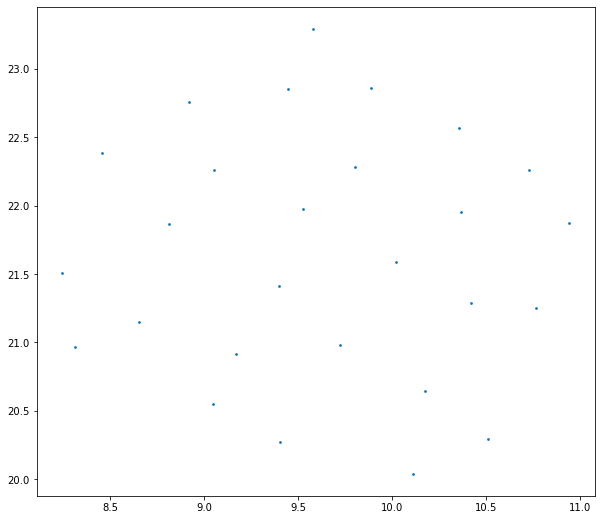

In [51]:
import umap

cluster_embedding = umap.UMAP(n_neighbors=30, min_dist=0.0,
                              n_components=2, random_state=42).fit_transform(X)

plt.figure(figsize=(10,9))
plt.scatter(cluster_embedding[:, 0], cluster_embedding[:, 1], s=3, cmap='Spectral')

Every dot in this plot is a product. As you can see, there are several tiny clusters of these datapoints. These are groups of similar products.

## Start Recommending Products

Congratulations! We are finally ready with the word2vec embeddings for every product in our online retail dataset. Now our next step is to suggest similar products for a certain product or a product's vector. 

Let's first create a product-ID and product-description dictionary to easily map a product's description to its ID and vice versa.

In [27]:
products = train_df[["StockCode", "Description"]]

# remove duplicates
products.drop_duplicates(inplace=True, subset='StockCode', keep="last")

# create product-ID and product-description dictionary
products_dict = products.groupby('StockCode')['Description'].apply(list).to_dict()

In [28]:
products_dict

{' account financ manag summari teamori account prepar clear comprehens financi report executivelevel managementi work account manag india privat sector compani also work financi sector onli right look entri level posit base studi unit state highlight from march skill familiar with vast array financ activ manag skill knowledg basic comput knowledg like offic word power point account audit gener administr basic comput cost knowledg talli analyt reason financi statement analysi strength regulatori report complianc test knowledg understand foreign report budget forecast expertis account reconcili expert financi planner complex problem solv effect time manag excel manageri techniqu gener ledger account expert custom relat superior research skill advanc comput profici accomplish account skill oper comput program with account softwar record store analyz inform gener ledger account maintain accur account includ cash inventori prepaid fix asset account payabl accru expens line credit transact 

In [29]:
# test the dictionary
products_dict['004ab133-3ece-45ba-b910-f9d94c3be75b']

KeyError: '004ab133-3ece-45ba-b910-f9d94c3be75b'

<br>

I have defined the function below. It will take a product's vector (n) as input and return top 6 similar products.

In [30]:
def similar_products(v, n = 6):
    
    # extract most similar products for the input vector
    ms = model.wv.most_similar(v, topn= n+1)[1:]
    
    # extract name and similarity score of the similar products
    new_ms = []
    for j in ms:
        pair = (products_dict[j[0]][0], j[1])
        new_ms.append(pair)
        
    return new_ms        

Let's try out our function by passing the vector of the product '90019A' ('SILVER M.O.P ORBIT BRACELET')

In [32]:
similar_products(model.wv['004ab133-3ece-45ba-b910-f9d94c3be75b'])

KeyError: "Key '004ab133-3ece-45ba-b910-f9d94c3be75b' not present"

In [52]:
model.wv.most_similar('excel')

KeyError: "Key 'excel' not present"

<br>

Cool! The results are pretty relevant and match well with the input product. However, this output is based on the vector of a single product only. What if we want recommend a user products based on the multiple purchases he or she has made in the past?

One simple solution is to take average of all the vectors of the products he has bought so far and use this resultant vector to find similar products. For that we will use the function below that takes in a list of product ID's and gives out a 100 dimensional vector which is mean of vectors of the products in the input list.

In [ ]:
def aggregate_vectors(products):
    product_vec = []
    for i in products:
        #print(i)
        try:
            product_vec.append(model.wv[i])
            
        except KeyError:
            continue
        
    print(product_vec)
    return np.mean(product_vec, axis=0)

In [ ]:
model.wv['378064bf-4242-4e58-bdc6-5aba4707efaa']

If you can recall, we have already created a separate list of purchase sequences for validation purpose. Now let's make use of that.

In [ ]:
len(purchases_val[1])

The length of the first list of products purchased by a user is 314. We will pass this products' sequence of the validation set to the function *aggregate_vectors*.

In [ ]:
aggregate_vectors(purchases_val[1]).shape

Well, the function has returned an array of 100 dimension. It means the function is working fine. Now we can use this result to get the most similar products. Let's do it.

In [ ]:
similar_products(aggregate_vectors(purchases_val[1]))

As it turns out, our system has recommended 6 products based on the entire purchase history of a user. Moreover, if you want to get products suggestions based on the last few purchases only then also you can use the same set of functions.

Below I am giving only the last 10 products purchased as input.

In [ ]:
similar_products(aggregate_vectors(purchases_val[1][-10:]))

Feel free to play this code, try to get product recommendation for more sequences from the validation set